# Notes on how to create and apply perturbations on  sea ice restart files (NEMO)

In [2]:
## standart libraries
import os,sys
import sys

import numpy as np
from scipy import stats

# xarray
import xarray as xr

# plot
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import matplotlib.pyplot as plt
from matplotlib.colors import Colormap
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
from matplotlib.colors import from_levels_and_colors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patches as patches
from matplotlib import animation
from matplotlib.colors import ListedColormap,LinearSegmentedColormap

from IPython.display import HTML

# for jupyter notebook display
%matplotlib inline

# 1. Define and go to working directory

```bash
LUdir="/lustre/fswork/projects/rech/cli/regi915/DEVGIT/ArcticBLISS-all/lu-simulator"
workingdir=${LUdir}"/examples/"
cd ${workingdir}
```

In [3]:
%cd /lustre/fswork/projects/rech/cli/regi915/DEVGIT/ArcticBLISS-all/lu-simulator/examples/

/lustre/fswork/projects/rech/cli/regi915/DEVGIT/ArcticBLISS-all/lu-simulator/examples


# 2. Setup environment for pyensdam and lu_simulator

On Jean Zay:
```bash
#!/bin/bash

module purge
module load gcc/9.1.0
module load cmake
module load intel-all
module load gcc/9.1.0
module load hdf5/1.10.5-mpi
module load netcdf/4.7.2-mpi
module load netcdf-fortran/4.5.2-mpi

module unload python
module load climate_science
```

Note that you might need to reload the python module interactively. I use climate_science/python3 but any recent python can work as long as you use the SAME exact environment as the one you used to build pyensdam (once for all).

# 3. Link to files
In the working directory i have prealably created paths for those required files:
```
mesh_mask_NANUK4_L31_4.2.nc                                        # usual mesh_mask/grid file from NEMO . 
grid.nc -> mesh_mask_NANUK4_L31_4.2.nc
reference.nc -> NANUK4_ICE_ABL-ABLBBM903_00007080_restart_ice.nc.  # restart sea-ice file to perturbed  from NEMO-SI3
mask.nc -> NANUK4_ICE_ABL-ABLBBM903_00007080_restart_ice_mask.nc   #  mask file for all the variables, prealably created following this
                                                                   # tuto: https://github.com/cmems-arcticbliss/lu-simulator/tree/main/
                                                                   # misc_tools/make_rstmask.
vargridinfo.asc.                                                   # list of variables to perturbed, prepared following the same link as above
```

# 4. Drown land (once for all for a given reference file)


```bash
#!/bin/bash
# input file 
grid_file="grid.nc"
mask_file="mask.nc"
vargrid_file="vargridinfo.asc"
ref_file="reference.nc"

# output file
unmasked_reference="unmasked_reference.nc"

python ../src/unmask_fields.py -ref ${ref_file} -v ${vargrid_file} -mask ${mask_file} -o ${unmasked_reference}
```

# 5. Create a damping file 
To avoid applying the perturbations too close to the coastline, we define a decreasing coeff from 1 (land) to 0 (where the perturbations will be fully applied) with a damping length scale of  l.

* -l option gives the damping length l in grid points
* -s option activates  a smoothing of the resulting damping file with s iterations of a 1-2-1 kernel.

```bash
#!/bin/bash

# Input parameters
ldamp=10  # damping scale in grid point
sm=$2

# input File paths
grid_file="grid.nc"
mask_file="mask.nc"
vargrid_file="vargridinfo.asc"
ref_file="reference.nc"

# output file path
damping_factor="damping_factor_ldamp${ldamp}"


# Generate damping factor
python ../src/generate_damping_factor.py -l ${ldamp} -s ${sm} -v $v{argrid_file} -mask ${mask_file} -o ${damping_factor}_s${sm}.nc
```

* Plot the damping factor without smoothing and zoom on some islands to illustrate sharp unrealistic gradients at grid point scale

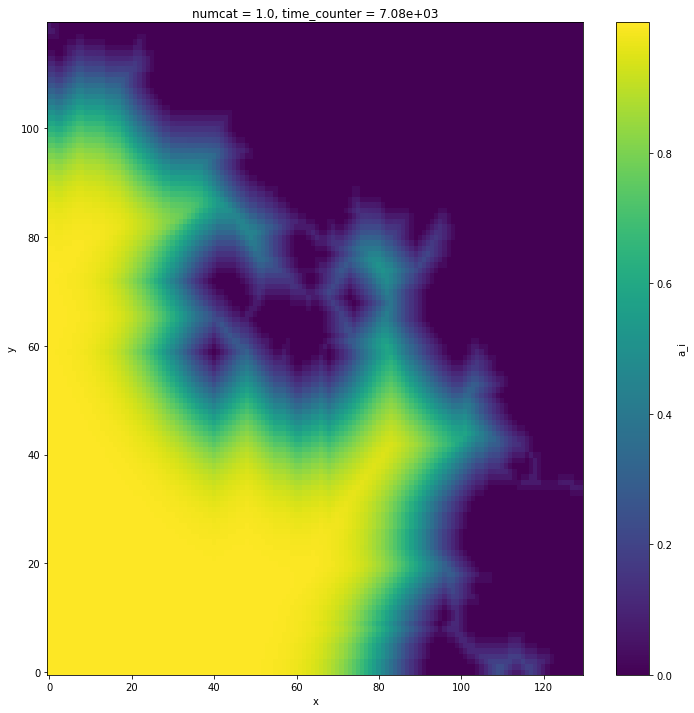

In [24]:
damping =  xr.open_dataset("damping_factor_ldamp10_s0.nc",decode_times=True)
fig1,(ax) = plt.subplots(1, 1, figsize=[12, 12],facecolor='w')
damping["a_i"][0,0,400:520,270:400].plot()

* Plot the damping factor with s=3  smoothing (remove most of the grid point gradients?)

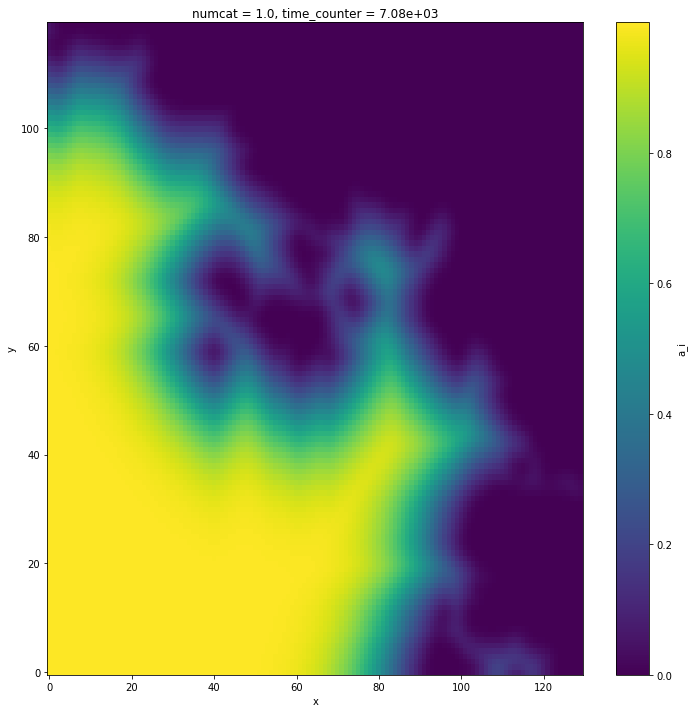

In [25]:
damping =  xr.open_dataset("damping_factor_ldamp10_s3.nc",decode_times=True)
fig1,(ax) = plt.subplots(1, 1, figsize=[12, 12],facecolor='w')
damping["a_i"][0,0,400:520,270:400].plot()

# 6. Sample N perturbations
* Apply the perturbation with correlation lengths in `l_values` on the restart file and generate N members.

```bash
#!/bin/bash

# input parameters
N=100   # number of members
l_values=(500) # correlation scale in km (if option -s is used forperturbation on the sphere)
grid_file="grid.nc"

# output file name
prefix_ofile="perturbation_sample"

for l in "${l_values[@]}"; do

  perturbation_file=${prefix_ofile}"_${l}km_N${N}.nc"
  python ../src/sample_perturbations.py -s -m ${N} -l ${l} -grid ${grid_file} -o ${perturbation_file}
done
```

* With the above script we have generated 100 samples of perturbation fields at the required horizontal correlation length scale. Let's plot those fields and check that for a given location, the perturbation dx,dy is an isotropic normal random vector with a standard deviation of 1.

In [4]:
pert =  xr.open_dataset("perturbation_sample_500km_N100.nc",decode_times=True)
pert

<xarray.Dataset>
Dimensions:  (member: 100, y: 566, x: 492)
Dimensions without coordinates: member, y, x
Data variables:
    dx       (member, y, x) float64 ...
    dy       (member, y, x) float64 ...

* Plot those N perturbations

In [7]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import cm
from IPython.display import HTML

# Number of timesteps in the output file
N = pert.member.size

# select colormap and set gray color for missing values (i.e. for land)
cmap = cm.Spectral_r

# select sea ice height
data2plt = pert.dx

fig, ax = plt.subplots(1, 1, figsize=[8, 8], facecolor='w')

# plot the initial frame
ie = 0
p = ax.pcolormesh(data2plt.isel(member=ie).values, vmin=-2.5, vmax=2.5, cmap=cmap)

# add date (create annotation that will be updated)
d = ax.text(10, 520, "Mb " + str(ie), fontsize=14, color="k", backgroundcolor='white')

# add colorbar
plt.colorbar(p, label='perturbation', extend='both')


# Animation function
def animate(ie):
    # Update the pcolormesh with new data
    p.set_array(data2plt.isel(member=ie).values.flatten())  # Flatten the 2D array for pcolormesh
    
    # Update the annotation text
    d.set_text("Mb " + str(ie))
    
    return p, d


# Initialization function
def init():
    # Initialize the pcolormesh for the first frame
    p.set_array(data2plt.isel(member=0).values.flatten())
    
    # Initialize the annotation
    d.set_text("Mb 0")
    
    return p, d


# Create the animation
ani = animation.FuncAnimation(fig=fig,
                              func=animate,
                              frames=N,
                              init_func=init,
                              interval=300,
                              blit=True)

# Close the figure after creating the animation to prevent showing the last plot
plt.close(fig)

# Show the animation
HTML(ani.to_jshtml())


* Now check the local std across members. Should be around 1 hopefully if N is large enough. If the perturbation follows a normal law in each location, the sample std for N=100 should be 1 with an error of about 7% (Relative_error=$\sigma/\sqrt{ 2N}$).

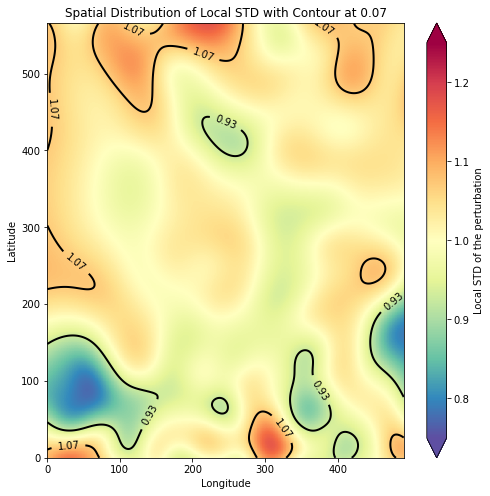

In [12]:
# select colormap 
cmap = cm.Spectral_r

# select sea ice height
data2plt = pert.dx

# Compute the local standard deviation across the ensemble members
std_data = data2plt.std(dim='member').values

fig, ax = plt.subplots(1, 1, figsize=[8, 8], facecolor='w')

# Plot the standard deviation data using pcolormesh
p = ax.pcolormesh(std_data, vmin=0.75, vmax=1.25, cmap=cmap)

# Add colorbar
plt.colorbar(p, label='Local STD of the perturbation', extend='both')

# Add a contour line where the standard deviation is err
err = round(1/np.sqrt(2*N),2)
contour = ax.contour(std_data, levels=[1-err,1+err], colors='black', linewidths=2)

# Add labels to the contour line
ax.clabel(contour, fmt="%.2f", inline=True, fontsize=10)

# Add optional title and labels
ax.set_title("Spatial Distribution of Local STD with Contour at 0.07")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

plt.show()
plt.close(fig)


In [38]:
data2plt.std(dim='member').max()

<xarray.DataArray 'dx' ()>
array(1.17673506)

# 7. Apply perturbations to the reference restart with a given std 
So far the std is still choosen in grid point. TOBE UPDATED soon so that std is set in km (need to normalize the damping factor by the size of the grid cells in km).

```bash
#!/bin/bash
#SBATCH --job-name=samp
#SBATCH -e samp.e%j
#SBATCH -o samp.o%j
#SBATCH --nodes=1
#SBATCH --ntasks=1
#SBATCH --time=03:0:00            # Temps d?~@~Yexécution maximum demande (HH:MM:SS)
#SBATCH -A cli@cpu 
#SBATCH --exclusive
#SBATCH --hint=nomultithread



# Input parameters
members=10      # Number of members (for -m)
l_values=(500)  # Split the second argument into an array of length scales in km
std_values=(0.01)  # in gridpoints so far TOBE UPDATED
ldamp=10
sm=3   # smoothing term in damping factor
interp="linear"

# File paths
grid_file="grid.nc"
mask_file="mask.nc"
vargrid_file="vargridinfo.asc"
ref_file="reference.nc"
unmasked_reference="unmasked_reference.nc"
damping_factor="damping_factor_ldamp${ldamp}_s{sm}.nc"

# Loop over the values of l and std
for l in "${l_values[@]}"; do

        perturbation_file="perturbation_file_${l}km_N10.nc"
        damping_factor="damping_factor_ldamp${ldamp}_s3.nc"

        # Now loop over std values for the final step
        for std in "${std_values[@]}"; do

                # Output filename
                output_file="l${l}_std${std}_interp${interp}_perturbed_ldamp${ldamp}s${sm}.nc"

                python ../src/apply_perturbations.py -m $members -std $std -grid $grid_file -mask $mask_file -i $perturbation_file -ref $unmasked_reference -factor ${damping_factor} -v $vargrid_file -interp ${interp} -o $output_file
        done
done
```